## 📌 **EDA** (Exploratory Data Analysis) : **탐색적 데이터 분석**
- 0912 pandas menual 파일에 있음! 했던 거임!!
- pandas -> Covid 전처리 시각화 -> EDA
- EDA를 하는 이유?
  - 워낙 방대한 빅데이터를 다루다보면, 해당 데이터를 실제 전처리 하기 전에 데이터의 형태, 신뢰도, 상관관계 등을 분석한 상태에서 작업을 실행 -> 효율 높아짐!

In [ ]:
# 마케팅 팀플 -> 데이터 팀플 (요때 많이 힘들어함,,,)
# 수집 / 저장 / 어떻게 시각화? / 그래프 (이게 안 됨!!! 문제)

In [ ]:
### 📍 탐색적 데이터 분석
1. 데이터 출처 & 주제에 대한 이해도 -> 국가/도시/확진자/사망자/회복/현재
2. 데이터의 크기 -> 모수 -> 신뢰도 -> 대표성
3. 데이터 구성 요소(column | feature)의 독립적인 속성 특징 & 상관관계 확인 및 분석
# 탐색적 데이터 분석의 결론(*주요 포인트) : 3번임. feature 데이터를 '어떻게 더 깊이 있게 분석하고 이해할 수 있을지' 그 인사이트가 있느냐로 승패가 좌지우지됨!!!!!

# 왜 크롤링 해야 하는가, 어떻게 해야 하는가, 어떻게 볼 것인가 => GA4도 마찬가지

In [ ]:
### feature 데이터의 깊이 있는 분석을 하기 위한 방법론적인 부분 존재
1. 위치 추정 : 현재 확보한 방대한 데이터의 대표값 산출해서 해당 feature의 요약 정보를 도출
  => 평균값 혹은 중앙값 등을 활용해서 해당 수치 데이터가 무엇을 의미하는지 판단

ex. [1, 2, 3, 100] = 4개의 숫자를 모두 더한 후 4로 나눈 숫자가 우리가 알고 있는 상식적인 평균은 맞으나, 4분의 3을 차지하는 게 1,2,3 (적은 숫자)임...
1) 평균(mean) : 일반 평균 = feature를 대표하는 평균
2) 가중평균(weighted mean) : 수집한 데이터 가운데 **신뢰도가 있거나 없는 정도에 따라서(주관적;;)** 가중치를 상이하게 준 후 평균값을 산출 => 위험(risk)
  => 가중평균은 리스크 있음 : 가중치를 적용/결정하는 판단 기준에 대한 신뢰도가 매우 중요!
3) **중간값** = 중앙값(median) : 전체 데이터를 정렬한 다음, 중간에 위치한 값을 취합함   (*위치 추정 방식에선 일반적으로 중간값을 많이 사용함!)
  => 중간값의 가장 큰 장점 : 특이값(outlier)의 영향을 최대한 받지 않는다
4) 절사평균(trimmed mean) = 최상위값, 최하위값에 데이터들이 몰려 있는 경우 => 특정 집단에 의해 평균값이 왜곡될 수 있음 -> 최상위값 & 최하위값을 절사
  => 이것도 절사하는 기준이 주관적이기 때문에 주의!


2. 변이 추정 : 현재 확보한 방대한 데이터의 분포(밀집해 있는지, 퍼져 있는지)를 확인 후 해당 feature의 요약 정보를 도출
  => 표준편차 혹은 분산 & 분포

1) 분산(variance) # 공식 피그잼에 그려놨는데 이해 못 했음... 그치만 계산은 pandas가 해준다!!! 걱정 ㄴㄴ
  => 평균과 각 데이터간의 차를 제곱한 값들의 합을 데이터 개수로 나눈 값
  => 모분산 | 표본분산
모분산 : 데이터 개수 전체를 기준으로 분산값을 계산한 방식
표본분산 : 분모의 값을 데이터 총 개수-1로 한 값

2) 표준편차(standard deviation)
  => 분산의 수치가 너무 커지기 때문에, 분산의 제곱근을 활용한 결과값

분산 => 평균과의 차이(편차)를 제곱해서 평균을 낸 값
왜 굳이 제곱을 하냐?
-> 더 많은 모수확보를 통해서 오차정도를 낮추기 위한 목적 

표준편차 => 분산의 제곱근, 분산의 값이 제곱단위로 결정되기 때문에 워낙 방대한 양
=> 데이터가 평균에서 평균적으로 얼만큼 떨어져 있는지를 확인하기 위해서 

-> 아무것도 모르겠다! 싶으면 이것만 기억하기!! <-
표준편차가 크면클수록 평균에서 상대적으로 많이 떨어져있다.
표준편차가 작으면 작을수록 평균에서 가까이 있다. 

# A반 : [70, 71, 69, 70, 70] => 70 -> 표준편차 값이 작다 = 안정적이다 ! (like 주식)
# B반 : [40, 100, 50, 90, 70] => 70
# 분산/표준편차 => A반

# A 주식 : 수익률 + 2%, +3%, +1%, +2%, +2% => 안정적
# B 주식 : 수익률 -10%, +15%, -8%, +20%, -5% => 위험성(불안도) 높음

In [ ]:
> EDA를 하기 전에 판단해야하는 데이터 분류 <

1) 수치형 데이터
- 연속형 (continuous) 데이터 : 특정한 범위 안에서 어떤 값 (*정수, 실수)을 가질 수 있는 데이터
    - 숫자는 연속성을 가지고 있다고 판단. 그래서 실수값을 무조건 가지고 있다.
- 이산 (discrete) 데이터 : 카운트와 같은 횟수 등의 정수값만 가질 수 있는 데이터
# 탐색적 데이터 분석을 초반에 할 때, 수치형 데이터 여부를 판단하려고 한다면 => 사분위 데이터!!
** 5 Number Summary (5개의 수치형 데이터를 빠르게 분석하려고 할 때 사용)
    - 최소값, 1사분위수, 중앙값, 3사분위수, 최대값의 5개의 수치형 데이터가 들어감! 
** Box Plot
** 도수분포표 (frequancy table) : 수치형 데이터를 구간으로 나눠서 각 구간에 속하는 데이터의 갯수를 취합한 테이블
** 히스토그램(histogram) -> 도수분포표를 시각적으로 표현한 그래프


2) 범주형 데이터
- 명목형 데이터 (nominal) : 카테고리, 타입, 항목 등 데이터 분류를 위해 이미 정해진 값이 있는 데이터 
    - (= 이진(binary) 데이터) => 0,1
    - 선택지를 가져갈 수 있음. 이거 아니면 저거 아니면 그거
    - 해당 데이터가 가질 수 있는 값의 수준을 levels라 명칭함 
- 순서형 데이터 : 이미 정해진 값 사이의 순서 관계가 존재하는 데이터
    - ex) 설문조사 => 매우 불만(1) ~ 매우 만족(5)
범주형 데이터 => 순서형 혹은 명목형 모두 범주안에 들어있는 각각의 데이터를 수준(levels)에 따라서 분류
# 매우 불만 : 5, 만족 7
수준에 따라서 데이터를 분류 및 시각화할 때, 2가지 형태로 나눠서 사용
    # - 절대빈도 : 절대적인 갯수
    # - 상대빈도 : 각각의 데이터를 모두 더했을 때, 그 가운데에서의 비율(%) => 파이그래프 (원형)
3) 시계열 데이터
- 일정시간 간격으로 배치된 데이터 (시간에 종속된 데이터)
반드시 시간의 시작과 끝이 존재하는! 그걸 몇 등분으로 나눌거냐! 
화면상에 효율적으로 출력하고자 할 때, 많이 사용하는 그래프 : 라인 & 막대그래프

#### freq
- ME : Month and Frequency
- QE : Quarter and Frequency
- YE : Year and Frequency
- D : Calender and Frequency
- h : Hourly and Frequency
- min : Minutely and Frequency
- s : Secondly and Frequency

#### 주요 날짜 포멧
- %Y : 4자리 연도
- %y : 2자리 연도
- %m : 2자리 월
- %d : 2자리 일
- %H : 24시간 형식의 시간
- %I : 12시간 형식의 시간
- %M : 분 (00분 59)
- %S : 초 (00초 59)
- %p : AM 또는 PM 표시
- %a : 축약된 요일이름 (Mon, Tue, Wed)
- %A : 비축약된 전체요일이름 (Monday)

In [9]:
import pandas as pd

df = pd.DataFrame({
    "A":[1, 2, 3, 4, 5, 6],
    "B":[1, 2, 3, 4, 5, 100]
})

df

,A,B
0,1,1
1,2,2
2,3,3
3,4,4
4,5,5
5,6,100


In [10]:
df.describe()  # => describe() 함수로 표준편차가 그냥 계산됨! 어머 세상에 개꿀이야 - by 세진쌤

,A,B
count,6.000000,6.000000
mean,3.500000,19.166667
std,1.870829,39.625329
min,1.000000,1.000000
25%,2.250000,2.250000
50%,3.500000,3.500000
75%,4.750000,4.750000
max,6.000000,100.000000


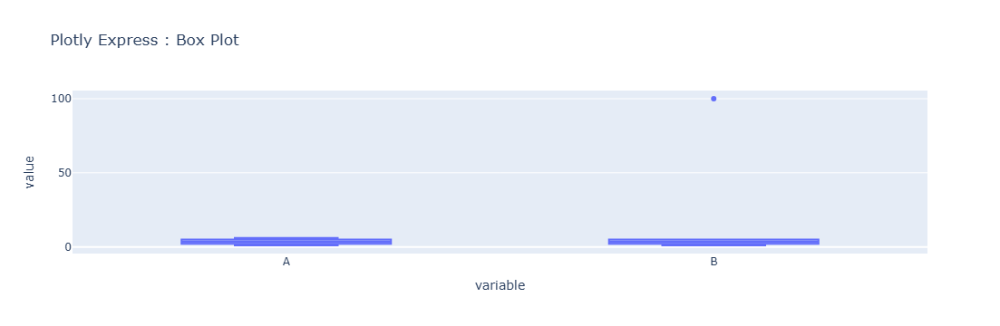

In [11]:
import plotly.express as px

fig = px.box(
    df,
    y = ["A", "B"],
    title = "Plotly Express : Box Plot"
)



fig.show()

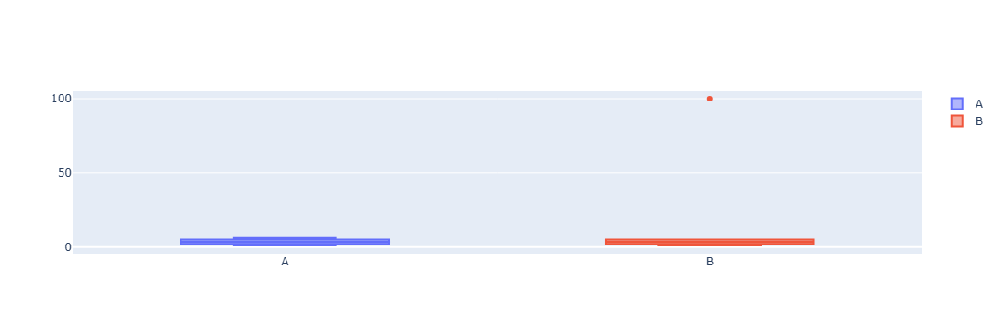

In [12]:
import plotly.graph_objects as go

fig = go.Figure()

fig.add_trace(
    go.Box(
        y=df["A"],
        name="A"
    )
)

fig.add_trace(
    go.Box(
        y=df["B"],
        name="B"
    )
)

fig.show()

In [14]:
import numpy as np
import pandas as pd

df = pd.DataFrame(np.random.rand(100000, 1), columns = ["A"])
# np.random.rand(100000, 1) => 뒤에 1 쓰면 5개만 깔림. 안 쓰면 10만개 다 깔린다....조심

df.head()

,A
0,0.509018
1,0.962246
2,0.729748
3,0.971853
4,0.868126


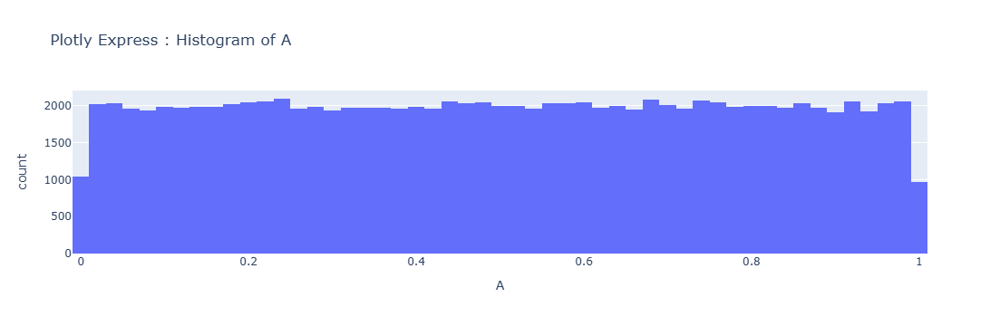

In [15]:
import plotly.express as px

fig = px.histogram(
    df,
    x = "A",
    nbins = 50,
    title = "Plotly Express : Histogram of A"
)

fig.show()

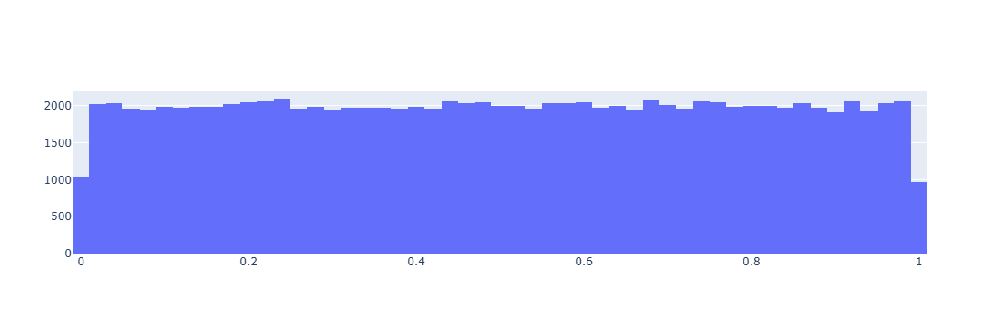

In [17]:
import plotly.graph_objects as go

fig = go.Figure()

fig.add_trace(
    go.Histogram(
        x = df["A"],
        nbinsx = 50
    )
)

fig.show()

In [37]:
import pandas as pd

data = {
    "year" : ["2017", "2017", "2019", "2020", "2026", "2026"],
    "grade" : ["C", "C", "B", "A", "B", "E"]
}

df = pd.DataFrame(data)

In [38]:
df

,year,grade
0,2017,C
1,2017,C
2,2019,B
3,2020,A
4,2026,B
5,2026,E


In [39]:
df1 = df.groupby("grade").count()
df2 = df.groupby("year").count()

In [40]:
df1

,year
grade,
A,1
B,2
C,2
E,1


In [41]:
df2

,grade
year,
2017,2
2019,1
2020,1
2026,2


In [42]:
df["year"].value_counts()

year
2017    2
2026    2
2019    1
2020    1
Name: count, dtype: int64

In [43]:
df["year"].size

6

In [44]:
df["year"].count()

np.int64(6)

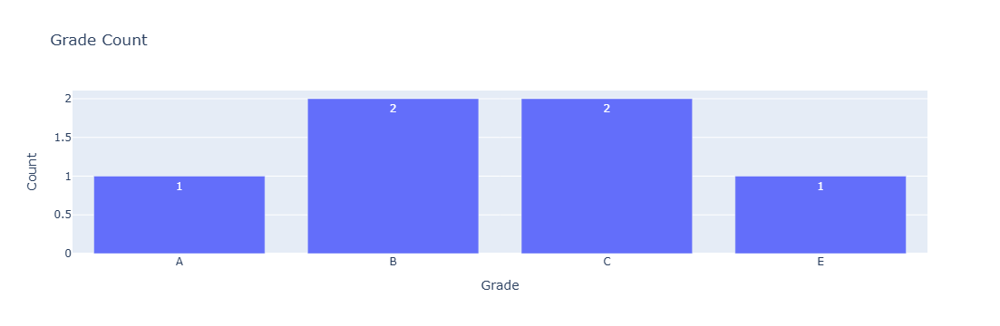

In [45]:
import plotly.express as px

fig = px.bar(
    x = df1.index,
    y = df1["year"],
    title = "Grade Count",
    labels = {"x" : "Grade", "y" : "Count"},
    text = df1["year"]
)

fig.show()

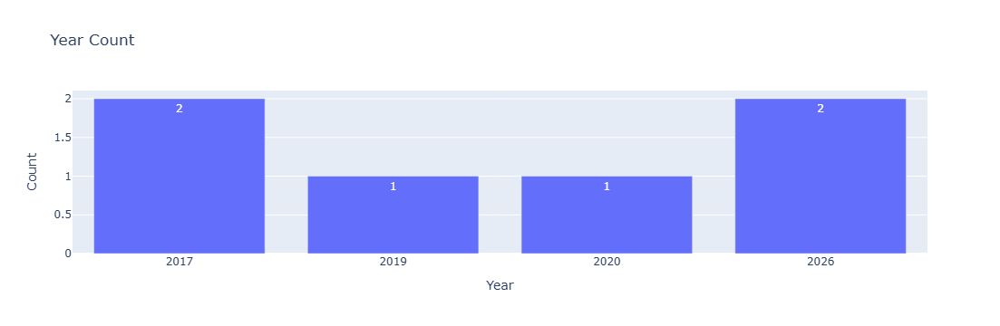

In [47]:
import plotly.express as px

fig = px.bar(
    x = df2.index,
    y = df2["grade"],
    title = "Year Count",
    labels = {"x" : "Year", "y" : "Count"},
    text = df2["grade"]
)

fig.show()

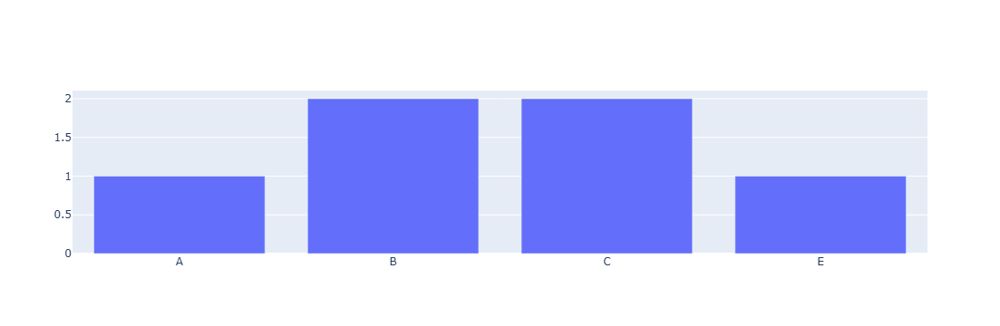

In [54]:
import plotly.graph_objects as go

fig = go.Figure()

fig.add_trace(
    go.Bar(
        x = df1.index,
        y = df1["year"]
    )
)

fig.show()

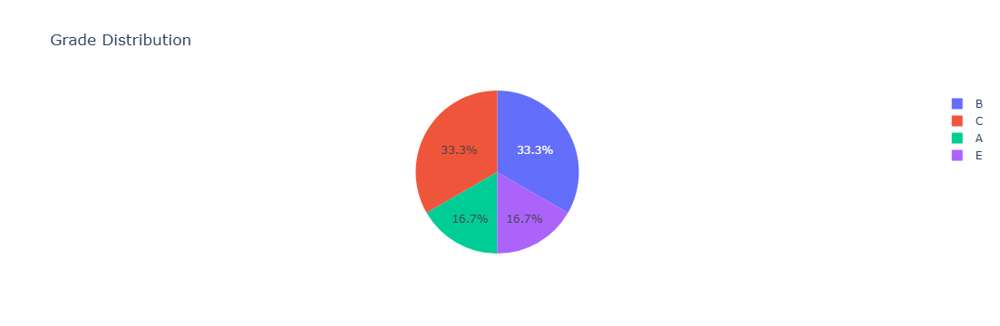

In [51]:
import plotly.express as go

fig = px.pie(
    values = df1["year"],
    names = df1.index,
    title = "Grade Distribution"
)

fig.show()

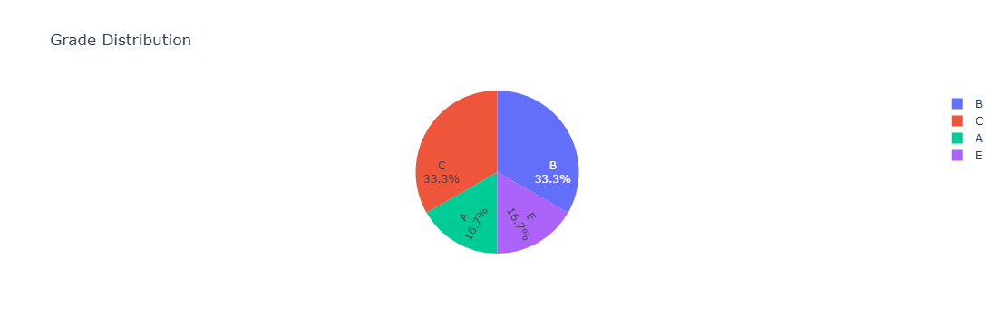

In [56]:
import plotly.graph_objects as go

fig = go.Figure()

fig.add_trace(
    go.Pie(
        labels = df1.index,
        values = df1["year"],
        textinfo = "label + percent",
        insidetextorientation = "radial"
        # radial : 각도가 꺾여지는 요소들을 방사형, horizontal : 수평, tangential : 모든 라벨을 방사형으로 배치해줌
    )
)

fig.update_layout(title_text = "Grade Distribution")

fig.show()

In [57]:
import pandas as pd

pd.date_range(start = "2020-01-01", end ="2020-12-31")

DatetimeIndex(['2020-01-01', '2020-01-02', '2020-01-03', '2020-01-04',
               '2020-01-05', '2020-01-06', '2020-01-07', '2020-01-08',
               '2020-01-09', '2020-01-10',
               ...
               '2020-12-22', '2020-12-23', '2020-12-24', '2020-12-25',
               '2020-12-26', '2020-12-27', '2020-12-28', '2020-12-29',
               '2020-12-30', '2020-12-31'],
              dtype='datetime64[ns]', length=366, freq='D')

In [60]:
pd.date_range(start = "2020-01-01", end ="2020-12-31", periods = 3)

DatetimeIndex(['2020-01-01 00:00:00', '2020-07-01 12:00:00',
               '2020-12-31 00:00:00'],
              dtype='datetime64[ns]', freq=None)

In [61]:
pd.date_range(start = "2020-01-01", end ="2020-12-31", freq = "3ME")
# freq = "3ME" => 3개월에 한 번! 몇 개의 조각(슬라이스)를 낼 거냐. 

DatetimeIndex(['2020-01-31', '2020-04-30', '2020-07-31', '2020-10-31'], dtype='datetime64[ns]', freq='3ME')

In [69]:
date_index = pd.date_range(start = "2026-01-01", end = "2026-01-31", freq = "2D")
df = pd.DataFrame(data = range(len(date_index)), columns = ["count"], index = date_index)
df


,count
2026-01-01,0
2026-01-03,1
2026-01-05,2
2026-01-07,3
2026-01-09,4
2026-01-11,5
2026-01-13,6
2026-01-15,7
2026-01-17,8
2026-01-19,9


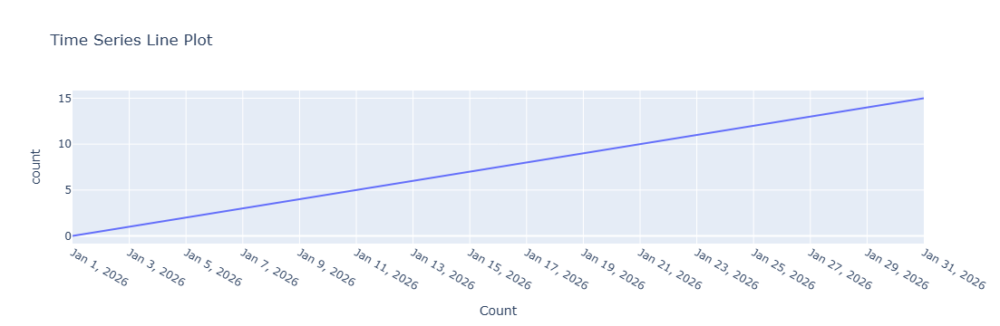

In [72]:
import plotly.express as px

fig_line = px.line(
    df,
    x = df.index,
    y = "count",
    title = "Time Series Line Plot"
)

fig_line.update_xaxes(title = "Date")
fig_line.update_xaxes(title = "Count")

fig_line.update_xaxes(
    # tickmode = "linear",
    # tickangle = 45
    tickmode = "array",
    tickvals = df.index,
    ticktext = [date.strftime("%Y-%m-%d") for date in df.index]
)

fig_line.show()

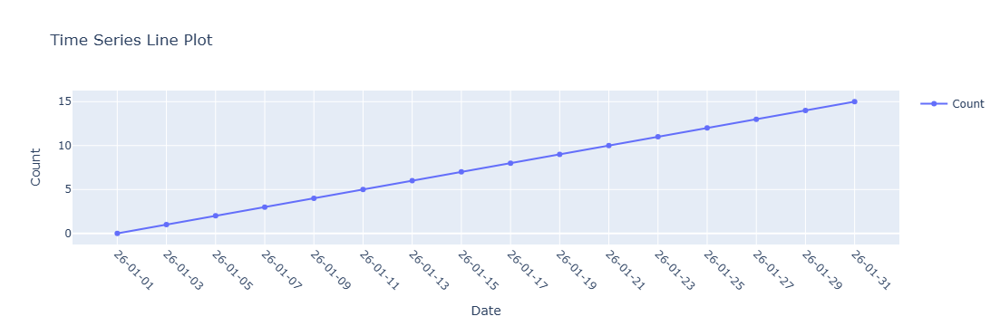

In [81]:
import plotly.graph_objects as go

fig_go_line = go.Figure()

fig_go_line.add_trace(
    go.Scatter(
        x = df.index,
        y = df["count"],
        mode = "lines+markers",
        name = "Count",
        showlegend = True
    )
)

fig_go_line.update_layout(
    title = "Time Series Line Plot",
    xaxis_title = "Date",
    yaxis_title = "Count",
)

fig_go_line.update_xaxes(
    tickmode = "array",
    tickvals = df.index,
    ticktext = [date.strftime("%y-%m-%d") for date in df.index],
    tickangle = 45
)

fig_go_line.show()

In [ ]:
<데이터 진도>

pandas + plotly 지금까지 60%정도 왔음.
내일부턴 실제 ecommerce 데이터 사용할 예정.
ecommerce와 연관된(우리 스킨푸드도 포함) 주제의 팀들은 실제 예제를 보면서 벤치마킹 많이 하면 좋을 듯!!!
이거 끝나면 Tableau 진도 나감.
Tableau 자격증 준비도 가능할 정도로 가르쳐주겟음...!
Power BI도 진도 나갈거임
끝나면 ML + DL 나감
-----그러면 데이터 진도 끝!!!


<마케팅 진도>
1) GA4
2) GTM
3) GMP -> Big Query, Lucker Studio
4) desktop 말고 application 기반으로 추적하는 법 배우고, app도 제작해볼거임. api 끌어와서. (react native활용) -> 파이어 베이스 통해서 데이터 수집
5) Data literacy
----- 마케팅 진도 끝!

-> 지금까지의 진도를 총망라하는 데이터+마케팅을 한꺼번에 해서 파이널 융합프로젝트 대비할거임.
크롤링 > 데이터 저장 > 시각화 > 데이터 수집, 분석 > GA 등의 총망라 하는 파이널 프로젝트를 진행할 것임